## Boilerplate

In [1]:
import sys
import subprocess
import os

if 'google.colab' in sys.modules:
    print("Running on Colab")

    # Clone repo using subprocess to run shell command inside if block
    subprocess.run([
        #'git', 'clone', '--recurse-submodules',
        'git', 'clone',
        'https://github.com/walligot/don_thesis.git'
    ])

    # Change directory
    os.chdir('/content/don_thesis')

    from google.colab import drive
    drive.mount('/content/drive')

    HOME = '/content/drive/MyDrive/Thesis'
    os.environ['HOME'] = HOME
    ROOT_PATH = '/content/don_thesis'
    os.environ['ROOT_PATH'] = ROOT_PATH
    DATA_PATH = '/content/drive/MyDrive/Thesis/data'
    os.environ['DATA_PATH'] = DATA_PATH

else:

    from pathlib import Path

    current_path = Path().resolve()

    ROOT_PATH = None
    for parent in [current_path] + list(current_path.parents):
        if "don_thesis" in parent.name.lower():
            ROOT_PATH = str(parent)
            DATA_PATH = str(parent)
            HOME = str(parent)
            os.environ['ROOT_PATH'] = ROOT_PATH
            os.environ['DATA_PATH'] = DATA_PATH
            os.environ['HOME'] = HOME
            break

    if not ROOT_PATH:
        raise FileNotFoundError("Directory with name 'don_thesis' not found.")

    print("Running locally or elsewhere")

%pip install git+https://github.com/mitchellostrow/DSA.git@a46c319
%pip install gpjax
#%pip install -U kaleido

sys.path.append('/content/don_thesis/src')
print(f"Root path: {ROOT_PATH}")

Running on Colab
Mounted at /content/drive
  Cloning https://github.com/mitchellostrow/DSA.git (to revision a46c319) to /tmp/pip-req-build-vfb60qic
  Running command git clone --filter=blob:none --quiet https://github.com/mitchellostrow/DSA.git /tmp/pip-req-build-vfb60qic
  Running command git checkout -q a46c319
  Resolved https://github.com/mitchellostrow/DSA.git to commit a46c319
  Preparing metadata (setup.py) ... done
  Using cached kooplearn-1.1.3-py3-none-any.whl.metadata (4.4 kB)
  Using cached POT-0.9.5-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (34 kB)
Using cached kooplearn-1.1.3-py3-none-any.whl (71 kB)
Using cached POT-0.9.5-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (901 kB)
  Created wheel for DSA: filename=DSA-1.0.1-py3-none-any.whl size=18952 sha256=d9ed51953761496e4006024bfce607c6a48317ff6f54ab4d8059f71267559445
  Stored in directory: /tmp/pip-ephem-wheel-cache-1qs5egxz/wheels/0e/80/f4/26d696d2a03c2d6a1f1614cdfd1c771928425184ab

## Load Models

In [2]:
import os
from nbit.training import load_rnn

home = os.environ['HOME']

threebitrnn = load_rnn(os.path.join(home, 'models', 'threebitrnnthesis.pth'))
twobitrnn = load_rnn(os.path.join(home, 'models', 'twobitrnnthesis.pth'))
twobitrnnseed444 = load_rnn(os.path.join(home, 'models', 'twobitrnn444thesis.pth'))
twobitrnnallrandom = load_rnn(os.path.join(home, 'models', 'twobitrnnallrandomthesis.pth'))

Using device: cpu
Loaded ContinuousRNN (N=100, n_bits=3) from '/content/drive/MyDrive/Thesis/models/threebitrnnthesis.pth'
Loaded ContinuousRNN (N=100, n_bits=2) from '/content/drive/MyDrive/Thesis/models/twobitrnnthesis.pth'
Loaded ContinuousRNN (N=100, n_bits=2) from '/content/drive/MyDrive/Thesis/models/twobitrnn444thesis.pth'
Loaded ContinuousRNN (N=100, n_bits=2) from '/content/drive/MyDrive/Thesis/models/twobitrnnallrandomthesis.pth'


## Analysis

### Eigenvalue Spectra

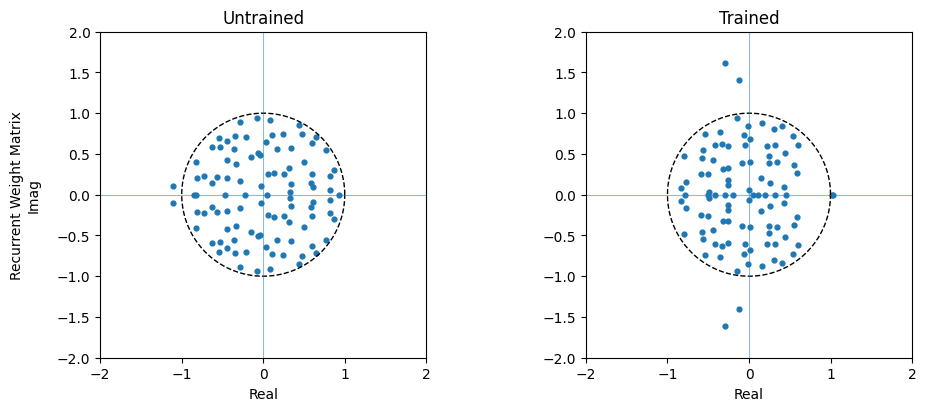

In [4]:
from nbit.analysis import plot_eig_spectra_grid
import matplotlib.pyplot as plt

fig, axes = plot_eig_spectra_grid([twobitrnnallrandom.recurrent_weights], [twobitrnn.recurrent_weights], ["Recurrent Weight Matrix"])
plt.show()

### Trajectory Plots

In [5]:
full_square = [
        [+1, +1],  # initial state
        [-1, +1],
        [-1, -1],
        [+1, -1],
        [+1, +1]   # close the loop
    ]
half_square = [
        [+1, +1],  # initial state
        [-1, +1],
        [-1, -1],
        [-1, +1],
        [+1, +1]   # close the loop
    ]

models = [twobitrnn, threebitrnn, twobitrnnseed444, twobitrnnseed444, twobitrnnallrandom, twobitrnnallrandom]
subplot_titles_traj = ["Baseline Case - Two Bit RNN (Seed 666, same input)",
                "Case 1 - Three Bit RNN (same input)",
                "Case 2 - Two Bit RNN (Seed 444, same input)",
                "Case 3 - Two Bit RNN (Seed 444, diff input)",
                "Case 4 - Two Bit RNN (Random weights, same input)",
                "Case 5 - Two Bit RNN (Random weights, diff input)",
                ]
subplot_titles_traj_short = ["Baseline Case",
                "Case 1",
                "Case 2",
                "Case 3",
                "Case 4",
                "Case 5",
                ]

input_transitions_list = [full_square, full_square, full_square, half_square, full_square, half_square]

100%|██████████| 15/15 [00:07<00:00,  1.90it/s]


PCA explained 94.22% of variance


100%|██████████| 15/15 [00:03<00:00,  4.56it/s]


PCA explained 93.23% of variance


100%|██████████| 15/15 [00:03<00:00,  4.47it/s]


PCA explained 95.60% of variance


100%|██████████| 15/15 [00:03<00:00,  4.53it/s]


PCA explained 95.05% of variance


100%|██████████| 15/15 [00:03<00:00,  4.60it/s]


PCA explained 64.09% of variance


100%|██████████| 15/15 [00:03<00:00,  4.52it/s]


PCA explained 64.20% of variance


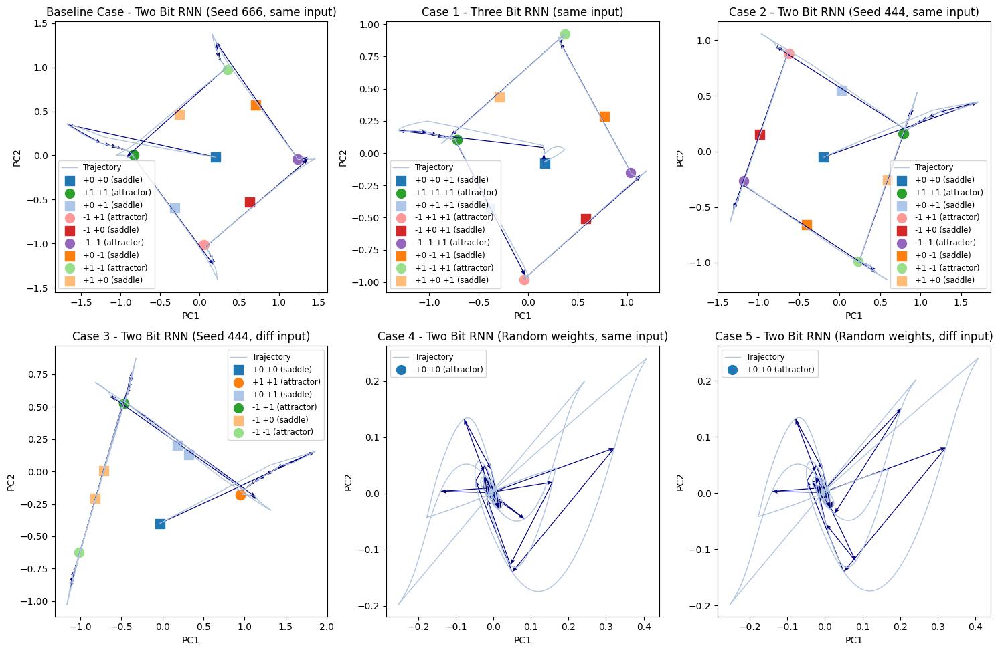

In [6]:
from nbit.analysis import plot_multiple_trajectories_grid

#Raw trajectory plot 2D
overall_title = ""

fixed_points_raw, memory_labels_raw, dynamics_labels_raw = plot_multiple_trajectories_grid(models, subplot_titles_traj, input_transitions_list, overall_title, add_noise=False)

In [ ]:
fixed_points_raw[0]
memory_labels_raw[0]
dynamics_labels_raw[0]

['saddle',
 'attractor',
 'attractor',
 'attractor',
 'saddle',
 'attractor',
 'attractor',
 'saddle',
 'attractor',
 'attractor',
 'saddle',
 'attractor',
 'attractor',
 'saddle',
 'attractor']

100%|██████████| 15/15 [00:05<00:00,  2.61it/s]


PCA explained 94.22% of variance


100%|██████████| 15/15 [00:05<00:00,  2.66it/s]


PCA explained 93.23% of variance


100%|██████████| 15/15 [00:05<00:00,  2.60it/s]


PCA explained 95.60% of variance


100%|██████████| 15/15 [00:05<00:00,  2.60it/s]


PCA explained 95.05% of variance


100%|██████████| 15/15 [00:05<00:00,  2.64it/s]


PCA explained 64.09% of variance


100%|██████████| 15/15 [00:05<00:00,  2.64it/s]


PCA explained 64.20% of variance


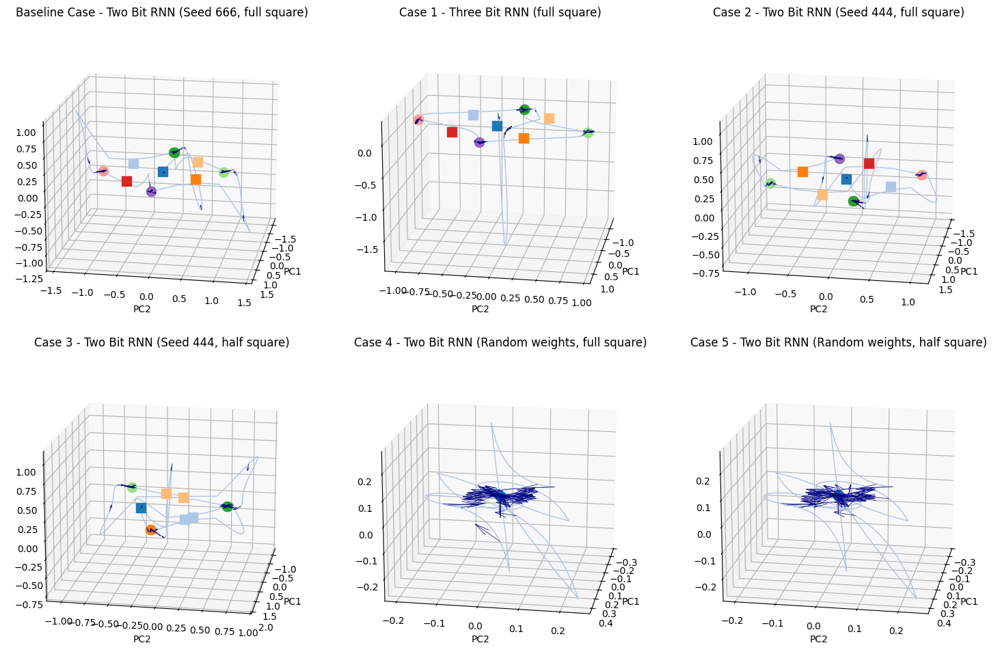

In [ ]:
from nbit.analysis import plot_multiple_trajectories_grid

#Raw trajectory plot 3D
overall_title = ""

plot_multiple_trajectories_grid(models, subplot_titles_traj, input_transitions_list, overall_title, add_noise=False, pca_dim=3)

100%|██████████| 15/15 [00:08<00:00,  1.81it/s]


PCA explained 85.82% of variance


100%|██████████| 15/15 [00:03<00:00,  4.36it/s]


PCA explained 81.13% of variance


100%|██████████| 15/15 [00:03<00:00,  4.43it/s]


PCA explained 86.96% of variance


100%|██████████| 15/15 [00:03<00:00,  4.42it/s]


PCA explained 84.54% of variance


100%|██████████| 15/15 [00:03<00:00,  4.43it/s]


PCA explained 28.88% of variance


100%|██████████| 15/15 [00:03<00:00,  4.44it/s]


PCA explained 28.49% of variance


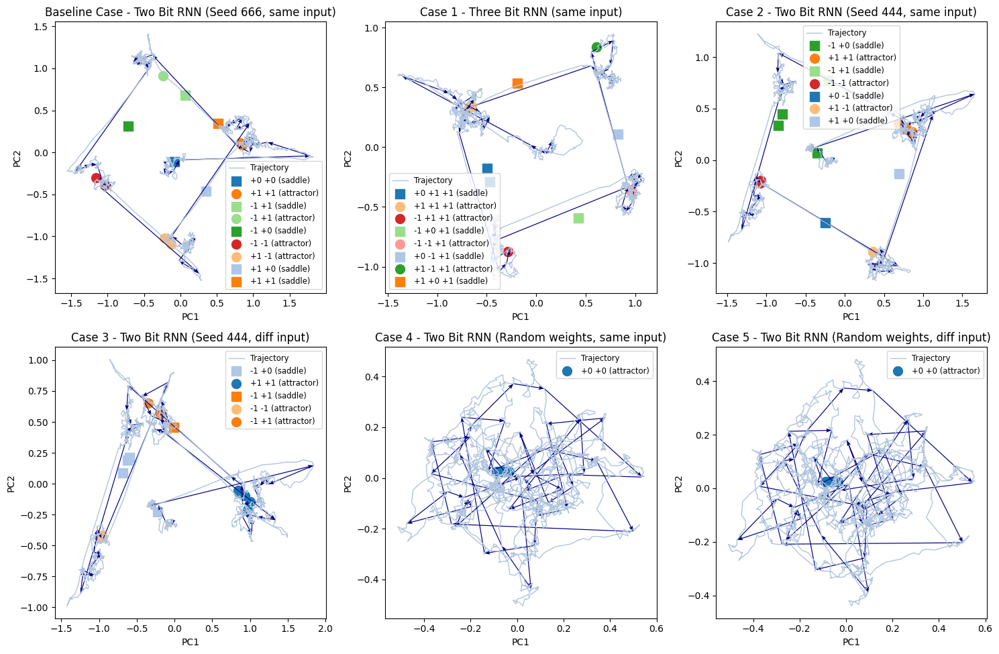

([array([[ 0.00122679,  0.01571882, -0.00046541, ..., -0.00049224,
           0.00071603,  0.00213852],
         [ 0.02161313,  0.24707612, -0.01135112, ..., -0.00217284,
           0.00824711,  0.01866301],
         [ 0.02079917,  0.24967405, -0.01088891, ..., -0.00348956,
           0.00821764,  0.01915382],
         ...,
         [-0.00035689, -0.18479238,  0.01765501, ..., -0.01258126,
           0.0137285 ,  0.03081982],
         [ 0.00900952,  0.03890091,  0.00418363, ..., -0.0074618 ,
           0.0102935 ,  0.02298673],
         [ 0.0150378 ,  0.23055898, -0.01231798, ...,  0.00206737,
           0.00112992,  0.00317279]], dtype=float32),
  array([[ 0.00769332,  0.02544951, -0.15981273, ..., -0.0096967 ,
           0.01517149, -0.07220387],
         [ 0.02139587,  0.01338167, -0.17304926, ..., -0.0030979 ,
          -0.0551144 , -0.37436542],
         [ 0.02066061,  0.01295917, -0.17291088, ..., -0.00337867,
          -0.05554834, -0.3736426 ],
         ...,
         [-0.014804

In [ ]:
from nbit.analysis import plot_multiple_trajectories_grid

# 2D plot with noise
overall_title = ""

torch.manual_seed(12345)
custom_noise = torch.randn(1, 5000, twobitrnn.N)

plot_multiple_trajectories_grid(models, subplot_titles_traj, input_transitions_list, overall_title, add_noise=custom_noise)

100%|██████████| 13/13 [00:02<00:00,  4.51it/s]


PCA explained 95.34% of variance


100%|██████████| 13/13 [00:02<00:00,  4.46it/s]


PCA explained 98.08% of variance


100%|██████████| 13/13 [00:02<00:00,  4.49it/s]


PCA explained 96.59% of variance


100%|██████████| 13/13 [00:02<00:00,  4.36it/s]


PCA explained 95.94% of variance


100%|██████████| 13/13 [00:02<00:00,  4.46it/s]


PCA explained 58.21% of variance


100%|██████████| 13/13 [00:02<00:00,  4.43it/s]


PCA explained 58.43% of variance


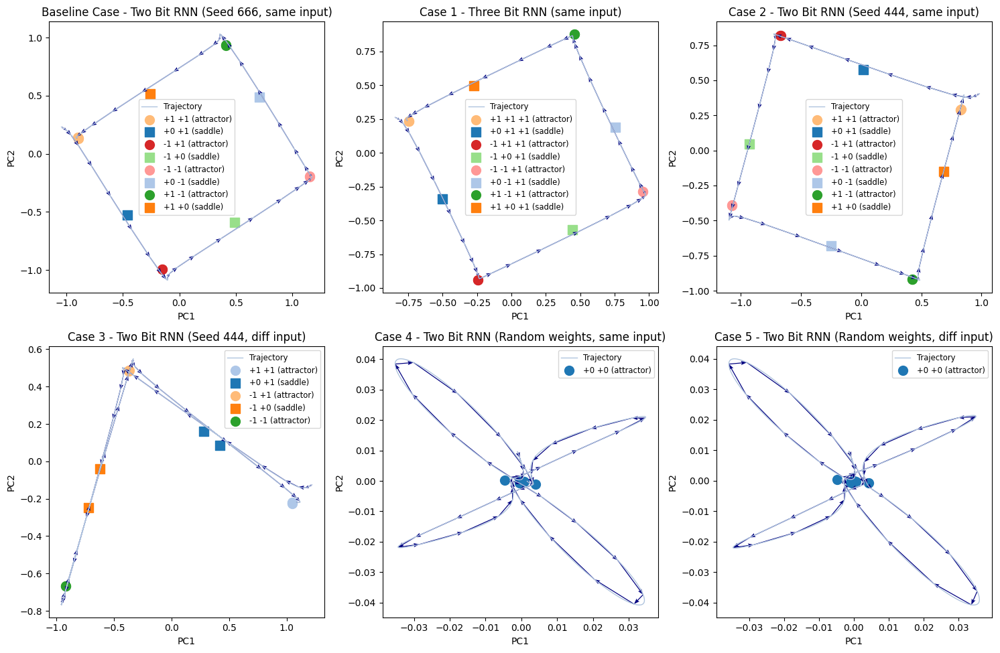

([array([[ 2.2504393e-02,  2.4956404e-01, -1.0726990e-02, ...,
          -3.5455879e-03,  8.6687710e-03,  1.9652110e-02],
         [ 2.8490238e-02,  2.5746199e-01, -9.2638480e-03, ...,
          -4.0251780e-03,  8.7986374e-03,  2.0973034e-02],
         [ 1.0733592e-02,  2.1250936e-01, -1.5774537e-02, ...,
           6.6956063e-03, -6.1901873e-03, -1.0597913e-02],
         ...,
         [-2.5176787e-04, -1.8590446e-01,  1.8001681e-02, ...,
          -1.2392592e-02,  1.4485149e-02,  3.1688962e-02],
         [ 9.4973035e-03,  4.0543336e-02,  4.7396892e-03, ...,
          -7.7511217e-03,  1.1401756e-02,  2.4575023e-02],
         [ 2.1164225e-02,  2.4754766e-01, -1.1195709e-02, ...,
          -1.9408906e-03,  7.7403379e-03,  1.8079523e-02]], dtype=float32),
  array([[ 0.02142888,  0.01270019, -0.17231059, ..., -0.00354701,
          -0.05527971, -0.37545714],
         [ 0.02134429,  0.01311735, -0.17342596, ..., -0.00282533,
          -0.05518514, -0.3767711 ],
         [ 0.00676347,  0.026

In [ ]:
from nbit.analysis import plot_multiple_trajectories_grid

# 2D plot with warmup period removed and gaussian smoothing
overall_title = ""

torch.manual_seed(12345)
custom_noise = torch.randn(1, 5000, twobitrnn.N)

plot_multiple_trajectories_grid(models, subplot_titles_traj, input_transitions_list, overall_title, smooth=True, sigma=50, burn_in=248)

### Similarity Analysis

In [7]:
import torch

torch.manual_seed(12345)
noise1 = torch.randn(1, 5000, twobitrnn.N)
noise2 = torch.randn(1, 5000, twobitrnn.N)

In [8]:
import DSA
from nbit.analysis import get_hs_for_dsa
device = "cpu"

# Dummy DSA run to auto calc the DSA rank hyperparameter
downsample=None
burn_in=248
test_rank = 16
window_size = 338
space_between_samples = 1

baseline_hs_no_noise = get_hs_for_dsa(twobitrnn, full_square, n_bits=twobitrnn.n_bits, downsample=downsample, burn_in=burn_in)
my_dsa = DSA.dsa.DSA(baseline_hs_no_noise, baseline_hs_no_noise,rank=test_rank, n_delays=window_size, delay_interval=space_between_samples, score_method = "angular", device=device)

# --- Access a single DMD ---
my_dmd = my_dsa.dmds[1][-1]

# --- Step-by-step DMD fit ---

# 1. Compute Hankel matrix
my_dmd.compute_hankel()
print("Hankel matrix shape:", my_dmd.H.shape)

# 2. Compute SVD
my_dmd.compute_svd()
print("SVD - U shape:", my_dmd.U.shape)
print("SVD - S shape:", my_dmd.S.shape)
print("SVD - V shape:", my_dmd.V.shape)

# 3. Explained variance: how many singular values explain >95%?
S = my_dmd.S
explained = (S**2) / torch.sum(S**2)
cumulative = torch.cumsum(explained, dim=0)
num_components_95 = torch.sum(cumulative < 0.95).item() + 1
print(f"Number of components explaining >95% variance: {num_components_95}")

auto_rank = num_components_95 + 2

Hankel matrix shape: torch.Size([1015, 33800])
SVD - U shape: torch.Size([33800, 1015])
SVD - S shape: torch.Size([1015])
SVD - V shape: torch.Size([1015, 1015])
Number of components explaining >95% variance: 16


In [ ]:
import DSA
from nbit.analysis import get_hs_for_dsa

downsample=None
burn_in=248

dsa_models = [threebitrnn, twobitrnnseed444, twobitrnnseed444, twobitrnnallrandom, twobitrnnallrandom, twobitrnn]
dsa_inputs = [full_square, full_square, half_square, full_square, half_square, full_square]

baseline_hs_no_noise = get_hs_for_dsa(twobitrnn, full_square, n_bits=twobitrnn.n_bits, downsample=downsample, burn_in=burn_in)
#noise_std = 0.01
#noise_1
baseline_hs_noise_1 = get_hs_for_dsa(twobitrnn, full_square, n_bits=twobitrnn.n_bits, add_noise=noise1, downsample=downsample, burn_in=burn_in)

#random_t = random_tensor[::downsample]

hs_no_noise = []
hs_noise_1 = []
hs_noise_2 = []
for i in range(len(dsa_models)):
    hs_no_noise.append(get_hs_for_dsa(dsa_models[i], dsa_inputs[i], n_bits=dsa_models[i].n_bits, downsample=downsample, burn_in=burn_in))
    #noise_std = 0.015
    hs_noise_1.append(get_hs_for_dsa(dsa_models[i], dsa_inputs[i], n_bits=dsa_models[i].n_bits, add_noise=noise1, downsample=downsample, burn_in=burn_in))
    #noise_std = 0.1
    hs_noise_2.append(get_hs_for_dsa(dsa_models[i], dsa_inputs[i], n_bits=dsa_models[i].n_bits, add_noise=noise2, downsample=downsample, burn_in=burn_in))

baseline_tensor = hs_no_noise[-1]
hi, lo = baseline_tensor.min(), baseline_tensor.max()
random_traj = lo + (hi - lo) * torch.rand_like(baseline_tensor)

hs_no_noise.insert(0, random_traj)
hs_noise_1.insert(0, random_traj)
hs_noise_2.insert(0, random_traj)

#noise_std = 0.015

p=window_size
r=auto_rank
delay_interval=1

#dsa_model_no_noise = DSA.dsa.DSA(baseline_hs_no_noise, hs_no_noise, rank=r, n_delays=p, score_method = "angular", device=device)
dsa_scores_no_noise = DSA.dsa.DSA(baseline_hs_no_noise, hs_no_noise, rank=r, n_delays=p, delay_interval=delay_interval, score_method = "angular", device=device).fit_score()
print(dsa_scores_no_noise)

#dsa_model_noise_1 = DSA.dsa.DSA(baseline_hs_noise_1, hs_noise_1, rank=r, n_delays=p, score_method = "angular", device=device)
dsa_scores_noise_1 = DSA.dsa.DSA(baseline_hs_noise_1, hs_noise_1, rank=r, n_delays=p, delay_interval=delay_interval, score_method = "angular", device=device).fit_score()
print(dsa_scores_noise_1)

#dsa_model_noise_2 = DSA.dsa.DSA(baseline_hs_noise_1, hs_noise_2, rank=r, n_delays=p, score_method = "angular", device=device)
dsa_scores_noise_2 = DSA.dsa.DSA(baseline_hs_noise_1, hs_noise_2, rank=r, n_delays=p, delay_interval=delay_interval, score_method = "angular", device=device).fit_score()
print(dsa_scores_noise_2)

[[1.55137706 0.01119331 0.00345267 0.01694645 0.00244141 0.00652364
  0.        ]]
[[1.55032218 0.01361519 0.00837942 0.01562897 0.01098367 0.00949958
  0.        ]]
[[1.55034959 0.01169845 0.00673051 0.01590495 0.01656581 0.01635578
  0.01447666]]


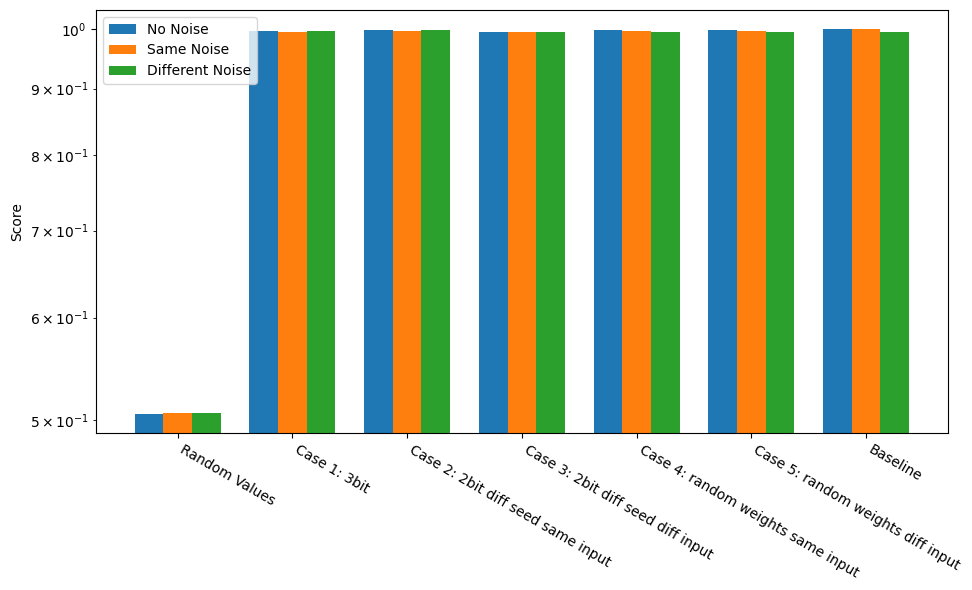

In [ ]:
from nbit.analysis import plot_grouped_bars

bar_titles = ["Random Values", "Case 1: 3bit", "Case 2: 2bit diff seed same input", "Case 3: 2bit diff seed diff input", "Case 4: random weights same input", "Case 5: random weights diff input", "Baseline"]
#plot_title = f"DSA comparison (r={r}, p={p}, delay_interval={delay_interval}, downsample={downsample})"
plot_title = ""
plot_grouped_bars(normalise_invert_dsa_angular(dsa_scores_no_noise[0]), normalise_invert_dsa_angular(dsa_scores_noise_1[0]), normalise_invert_dsa_angular(dsa_scores_noise_2[0]), bar_titles, plot_title, log_scale=True)

In [11]:
import DSA
from nbit.analysis import get_hs_for_dsa_random

# Dummy DSA run to auto calc the DSA rank hyperparameter
downsample=None
burn_in=50
test_rank = 16
window_size = 10
space_between_samples = 1
batch_size = 50
T = 1000

same_seed = 888
diff_seed = 999

torch.manual_seed(12345)
noise1 = torch.randn(batch_size, 5000, twobitrnn.N)
noise2 = torch.randn(batch_size, 5000, twobitrnn.N)

model = twobitrnn
torch.manual_seed(same_seed)
baseline_hs_no_noise = get_hs_for_dsa_random(twobitrnn, T, batch_size, n_bits=twobitrnn.n_bits, squeeze=False, burn_in=burn_in)
my_dsa = DSA.dsa.DSA(baseline_hs_no_noise, baseline_hs_no_noise,rank=test_rank, n_delays=window_size, delay_interval=space_between_samples, score_method = "angular", device=device)

# --- Access a single DMD ---
my_dmd = my_dsa.dmds[1][-1]

# --- Step-by-step DMD fit ---

# 1. Compute Hankel matrix
my_dmd.compute_hankel()
print("Hankel matrix shape:", my_dmd.H.shape)

# 2. Compute SVD
my_dmd.compute_svd()
print("SVD - U shape:", my_dmd.U.shape)
print("SVD - S shape:", my_dmd.S.shape)
print("SVD - V shape:", my_dmd.V.shape)

# 3. Explained variance: how many singular values explain >95%?
S = my_dmd.S
explained = (S**2) / torch.sum(S**2)
cumulative = torch.cumsum(explained, dim=0)
num_components_95 = torch.sum(cumulative < 0.95).item() + 1
print(f"Number of components explaining >95% variance: {num_components_95}")

auto_rank = num_components_95 + 2

Hankel matrix shape: torch.Size([50, 941, 1000])
SVD - U shape: torch.Size([1000, 1000])
SVD - S shape: torch.Size([1000])
SVD - V shape: torch.Size([47050, 1000])
Number of components explaining >95% variance: 6


In [12]:
import DSA
from nbit.analysis import get_hs_for_dsa_random

downsample=None
burn_in=248
T_eval = 1000
batch_size = 50

dsa_models = [threebitrnn, twobitrnnseed444, twobitrnnseed444, twobitrnnallrandom, twobitrnnallrandom, twobitrnn]
dsa_seeds = [same_seed, same_seed, diff_seed, same_seed, diff_seed, same_seed]

torch.manual_seed(same_seed)
baseline_hs_no_noise = get_hs_for_dsa_random(twobitrnn, T_eval, batch_size, n_bits=twobitrnn.n_bits, squeeze=False, burn_in=burn_in)
#noise_std = 0.01
#noise_1
torch.manual_seed(same_seed)
baseline_hs_noise_1 = get_hs_for_dsa_random(twobitrnn, T_eval, batch_size, n_bits=twobitrnn.n_bits, squeeze=False, burn_in=burn_in, add_noise=noise1)

#random_t = random_tensor[::downsample]

hs_no_noise = []
hs_noise_1 = []
hs_noise_2 = []
for i in range(len(dsa_models)):
    torch.manual_seed(dsa_seeds[i])
    hs_no_noise.append(get_hs_for_dsa_random(dsa_models[i], T_eval, batch_size, n_bits=dsa_models[i].n_bits, squeeze=False, burn_in=burn_in, add_noise=False))
    torch.manual_seed(dsa_seeds[i])
    hs_noise_1.append(get_hs_for_dsa_random(dsa_models[i], T_eval, batch_size, n_bits=dsa_models[i].n_bits, squeeze=False, burn_in=burn_in, add_noise=noise1))
    torch.manual_seed(dsa_seeds[i])
    hs_noise_2.append(get_hs_for_dsa_random(dsa_models[i], T_eval, batch_size, n_bits=dsa_models[i].n_bits, squeeze=False, burn_in=burn_in, add_noise=noise2))


    #hs_no_noise.append(get_hs_for_dsa(dsa_models[i], dsa_inputs[i], n_bits=dsa_models[i].n_bits, downsample=downsample, burn_in=burn_in))
    #hs_noise_1.append(get_hs_for_dsa(dsa_models[i], dsa_inputs[i], n_bits=dsa_models[i].n_bits, add_noise=noise1, downsample=downsample, burn_in=burn_in))
    #hs_noise_2.append(get_hs_for_dsa(dsa_models[i], dsa_inputs[i], n_bits=dsa_models[i].n_bits, add_noise=noise2, downsample=downsample, burn_in=burn_in))

baseline_tensor = hs_no_noise[-1]
hi, lo = baseline_tensor.min(), baseline_tensor.max()
random_traj = lo + (hi - lo) * torch.rand_like(baseline_tensor)

hs_no_noise.insert(0, random_traj)
hs_noise_1.insert(0, random_traj)
hs_noise_2.insert(0, random_traj)

p=window_size
r=auto_rank
delay_interval=1

#dsa_model_no_noise = DSA.dsa.DSA(baseline_hs_no_noise, hs_no_noise, rank=r, n_delays=p, score_method = "angular", device=device)
dsa_scores_random_no_noise = DSA.dsa.DSA(baseline_hs_no_noise, hs_no_noise, rank=r, n_delays=p, delay_interval=delay_interval, score_method = "angular", device=device).fit_score()
print(dsa_scores_random_no_noise)

#dsa_model_noise_1 = DSA.dsa.DSA(baseline_hs_noise_1, hs_noise_1, rank=r, n_delays=p, score_method = "angular", device=device)
dsa_scores_random_noise_1 = DSA.dsa.DSA(baseline_hs_noise_1, hs_noise_1, rank=r, n_delays=p, delay_interval=delay_interval, score_method = "angular", device=device).fit_score()
print(dsa_scores_random_noise_1)

#dsa_model_noise_2 = DSA.dsa.DSA(baseline_hs_noise_1, hs_noise_2, rank=r, n_delays=p, score_method = "angular", device=device)
dsa_scores_random_noise_2 = DSA.dsa.DSA(baseline_hs_noise_1, hs_noise_2, rank=r, n_delays=p, delay_interval=delay_interval, score_method = "angular", device=device).fit_score()
print(dsa_scores_random_noise_2)

[[1.77772272e+00 2.69692410e-02 4.51495545e-03 5.53505775e-03
  3.28690112e-02 3.54114994e-02 3.45266977e-04]]
[[1.77819872 0.02659307 0.00352105 0.00325724 0.05007013 0.05010347
  0.        ]]
[[1.77819884 0.02657064 0.00358812 0.00357147 0.05019621 0.05092741
  0.00274047]]


In [13]:
from nbit.analysis import batched_procrustes_distance
procrustes_scores_random_no_noise = 1 - batched_procrustes_distance([baseline_hs_no_noise], hs_no_noise)[0]
procrustes_scores_random_noise_1 = 1 - batched_procrustes_distance([baseline_hs_noise_1], hs_noise_1)[0]
procrustes_scores_random_noise_2 = 1 - batched_procrustes_distance([baseline_hs_noise_1], hs_noise_2)[0]

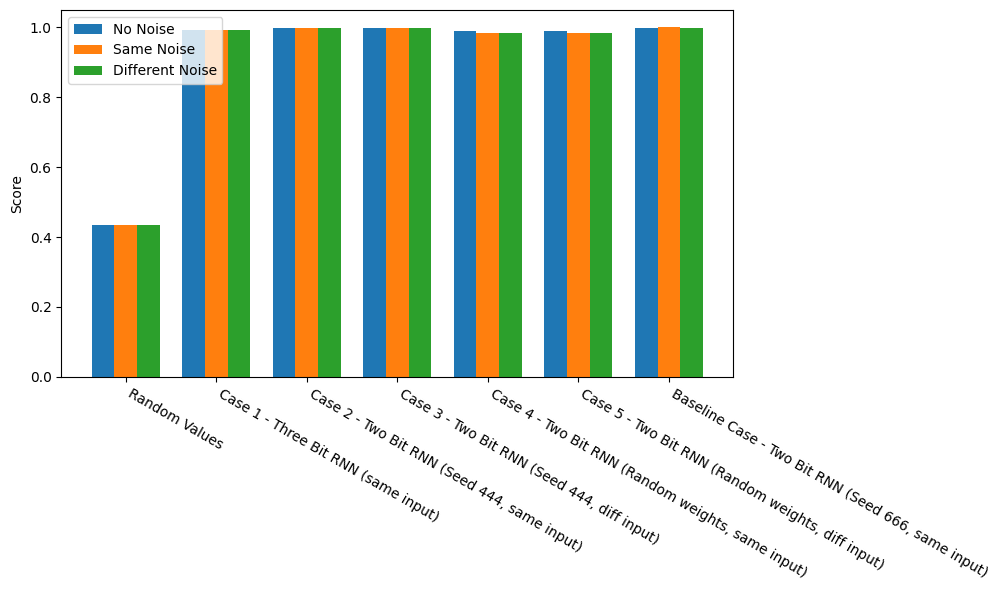

In [14]:
from nbit.analysis import plot_grouped_bars, normalise_invert_dsa_angular

#bar_titles = ["Random Values", "Case 1: 3bit", "Case 2: 2bit diff seed same input", "Case 3: 2bit diff seed diff input", "Case 4: random weights same input", "Case 5: random weights diff input", "Baseline"]
bar_titles = ["Random Values"] + subplot_titles_traj[1:] + subplot_titles_traj[:1]
#def rotate_and_insert(lst, new_element):
#    return [new_element] + lst[1:] + lst[:1]


#plot_title = f"DSA comparison (r={r}, p={p}, delay_interval={delay_interval}, downsample={downsample})"
plot_title = ""
plot_grouped_bars(normalise_invert_dsa_angular(dsa_scores_random_no_noise[0]), normalise_invert_dsa_angular(dsa_scores_random_noise_1[0]), normalise_invert_dsa_angular(dsa_scores_random_noise_2[0]), bar_titles, plot_title, log_scale=False)

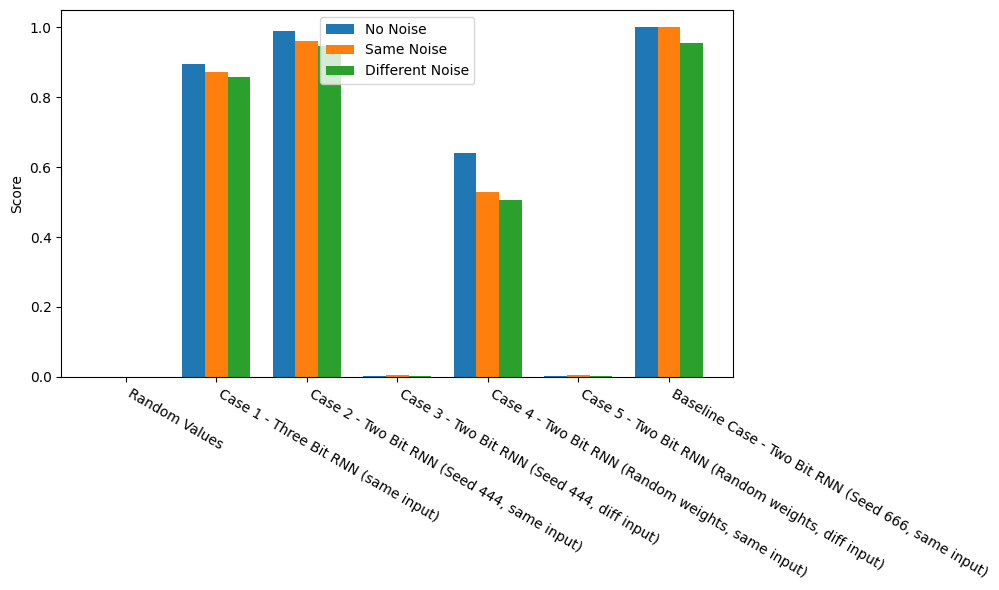

In [15]:
from nbit.analysis import plot_grouped_bars
bar_titles = ["Random Values"] + subplot_titles_traj[1:] + subplot_titles_traj[:1]
plot_grouped_bars(procrustes_scores_random_no_noise, procrustes_scores_random_noise_1, procrustes_scores_random_noise_2, bar_titles, plot_title, log_scale=False)

In [16]:
import DSA
from nbit.analysis import get_hs_for_dsa_random

#

dsa_models = [threebitrnn, twobitrnnseed444, twobitrnnseed444, twobitrnnallrandom, twobitrnnallrandom, twobitrnn]
dsa_seeds = [same_seed, same_seed, diff_seed, same_seed, diff_seed, same_seed]

hs_raw = []
#hs_smooth = []
for i in range(len(dsa_models)):
    torch.manual_seed(dsa_seeds[i])
    hs_raw.append(get_hs_for_dsa_random(dsa_models[i], T_eval, batch_size, n_bits=dsa_models[i].n_bits, squeeze=False, burn_in=burn_in, add_noise=False))
    #torch.manual_seed(dsa_seeds[i])
    #hs_smooth.append(get_hs_for_dsa_random(dsa_models[i], T_eval, batch_size, n_bits=dsa_models[i].n_bits, squeeze=False, burn_in=burn_in, add_noise=False, pca_dim=2))

baseline_tensor = hs_raw[-1]
hi, lo = baseline_tensor.min(), baseline_tensor.max()
random_traj = lo + (hi - lo) * torch.rand_like(baseline_tensor)

hs_raw.insert(0, random_traj)
#hs_smooth.insert(0, random_traj)

p=window_size
r=auto_rank
delay_interval=1

dsa_scores_raw = DSA.dsa.DSA(hs_raw, rank=r, n_delays=p, delay_interval=delay_interval, score_method = "angular", device=device).fit_score()
#dsa_scores_smooth = DSA.dsa.DSA(hs_smooth, rank=r, n_delays=p, delay_interval=delay_interval, score_method = "angular", device=device).fit_score()
dsa_raw = normalise_invert_dsa_angular(dsa_scores_raw)
#dsa_smooth = normalise_invert_dsa_angular(dsa_scores_smooth)
#print(dsa_scores_random_matrix)

In [17]:
from nbit.analysis import batched_procrustes_distance

procrustes_raw = 1 - batched_procrustes_distance(hs_raw, hs_raw)
#procrustes_smooth = 1 - batched_procrustes_distance(hs_smooth, hs_smooth)

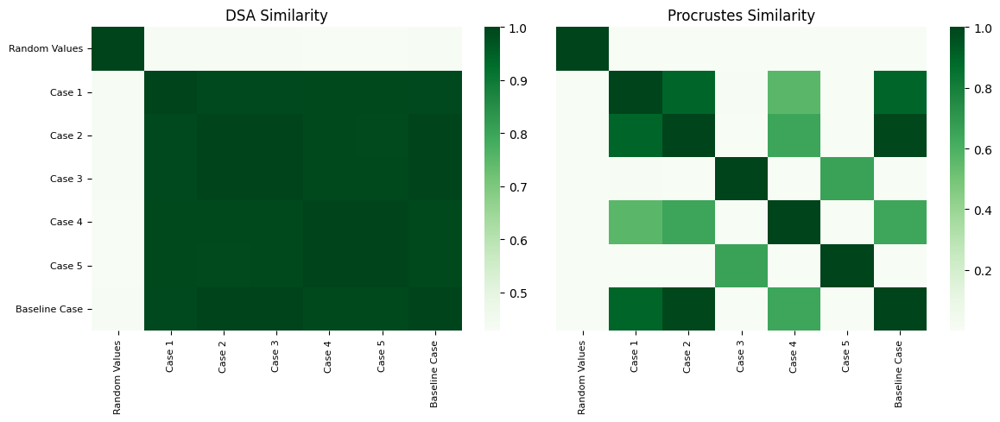

In [18]:
from nbit.analysis import plot_similarity_matrices_raw

matrix_labels = ["Random Values"] + subplot_titles_traj_short[1:] + subplot_titles_traj_short[:1]
plot_similarity_matrices_raw(dsa_raw, procrustes_raw, labels=matrix_labels)

In [19]:
from nbit.analysis import plot_multiple_trajectories_plotly_grid

#multiple_labels = subplot_titles_traj_short[1:] + subplot_titles_traj_short[:1]
#fixed_points_plot = [fixed_points_raw[2] for i in fixed_points_raw]
multiple_labels = subplot_titles_traj_short
fixed_points_plot = fixed_points_raw
fixed_points_plot[3] = fixed_points_plot[2]
hs_plot = hs_raw[-1:] + hs_raw[1:-1]
plot_multiple_trajectories_plotly_grid(hs_plot, "", pca_dim=2, labels=multiple_labels, fixed_points=fixed_points_plot, memory_labels_list=memory_labels_raw, dynamics_labels_list=dynamics_labels_raw)
#,save_path="/content/drive/MyDrive/Thesis/trajectories_multiple.html")

PCA explained 79.41% of variance
PCA explained 73.12% of variance
PCA explained 80.04% of variance
PCA explained 80.90% of variance
PCA explained 72.10% of variance
PCA explained 72.72% of variance
